In [1]:
# fbprophet for 1 day prediction
import pandas as pd
from prophet import Prophet

In [2]:
df = pd.read_csv('December-2019.csv')
df.head()

,ds,KE
0,12/1/2019 0:00,207
1,12/1/2019 0:01,206
2,12/1/2019 0:02,205
3,12/1/2019 0:03,205
4,12/1/2019 0:04,205


In [14]:
df["ds"]=pd.to_datetime(df['ds'])
df=df.rename(columns={'KE':'y'})

In [15]:
df.head()

,ds,y
0,2019-12-01 00:00:00,207
1,2019-12-01 00:01:00,206
2,2019-12-01 00:02:00,205
3,2019-12-01 00:03:00,205
4,2019-12-01 00:04:00,205


In [16]:
m = Prophet()
m.fit(df)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [18]:
future = m.make_future_dataframe(periods=1) # periods is in days
future.tail()

,ds
44636,2019-12-31 23:56:00
44637,2019-12-31 23:57:00
44638,2019-12-31 23:58:00
44639,2019-12-31 23:59:00
44640,2020-01-01 23:59:00


In [19]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
44636,2019-12-31 23:56:00,109.299692,87.920521,130.301405
44637,2019-12-31 23:57:00,109.275416,87.586317,131.752776
44638,2019-12-31 23:58:00,109.251343,86.793921,130.823092
44639,2019-12-31 23:59:00,109.227473,87.207272,132.503299
44640,2020-01-01 23:59:00,89.847463,63.930409,117.013536


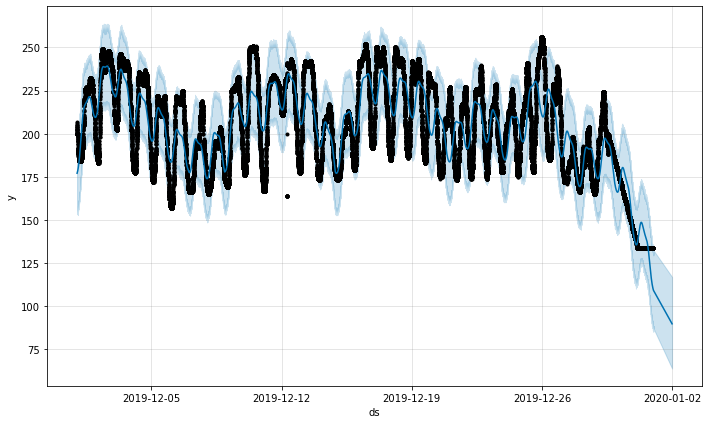

In [20]:
fig1 = m.plot(forecast)

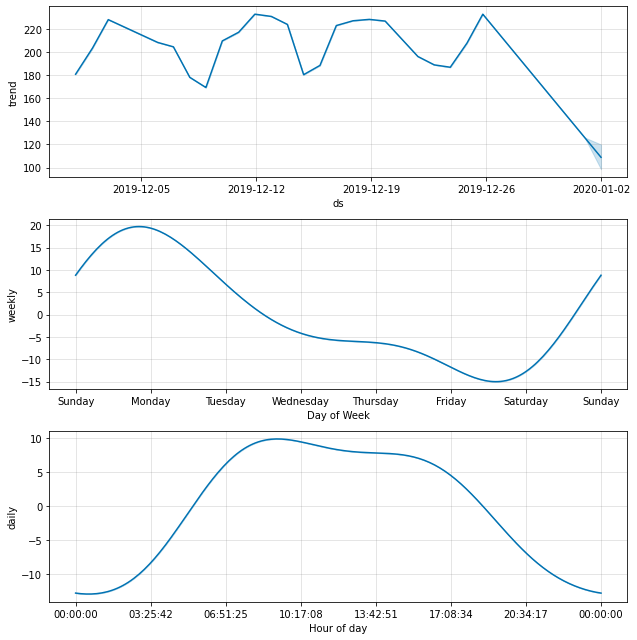

In [21]:
fig2 = m.plot_components(forecast)

In [1]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

NameError: name 'm' is not defined

In [11]:
plot_components_plotly(m, forecast)